In [1]:
import sys
import os
from PIL import Image
import time
import matplotlib.pyplot as plt
import numpy as np

src = os.path.abspath(os.path.join(os.getcwd(), '../src'))
sys.path.insert(0, src)

image_path = '../targets/face.png'

from evolution import evolve

[13:04:52] Initial population initialization ...
[13:05:15] Population initialized.
Generation 1/30000. Best fitness: 5821.862. Mutation rate: 0.500, time [13:05:15]


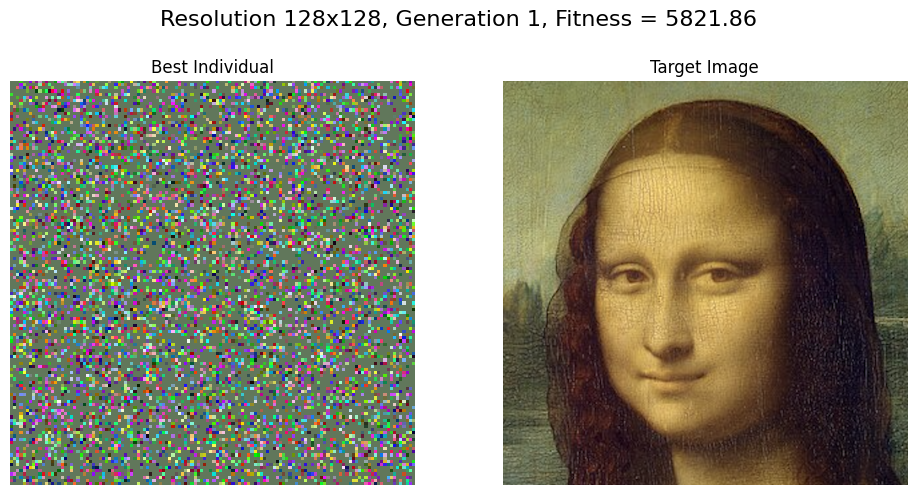

Generation 2/30000. Best fitness: 5098.163. Mutation rate: 0.500, time [13:05:15]


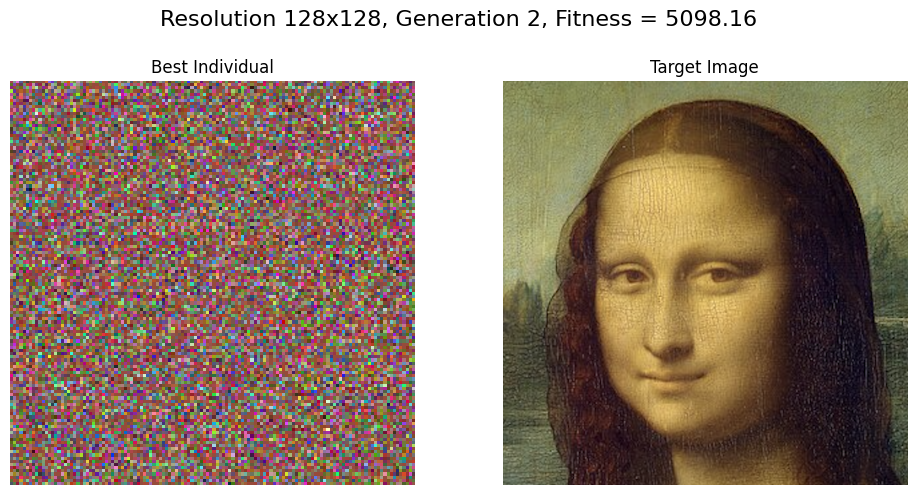

Generation 5/30000. Best fitness: 4034.907. Mutation rate: 0.500, time [13:05:16]


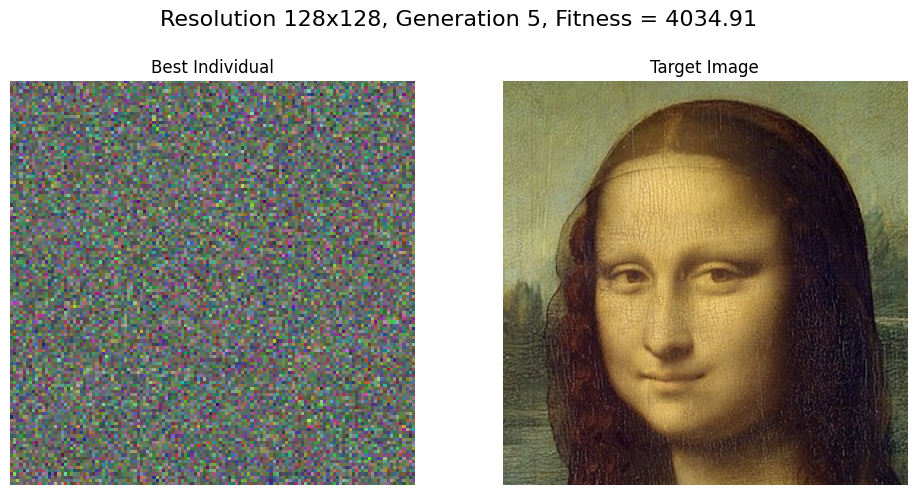

Generation 10/30000. Best fitness: 3873.540. Mutation rate: 0.478, time [13:05:16]


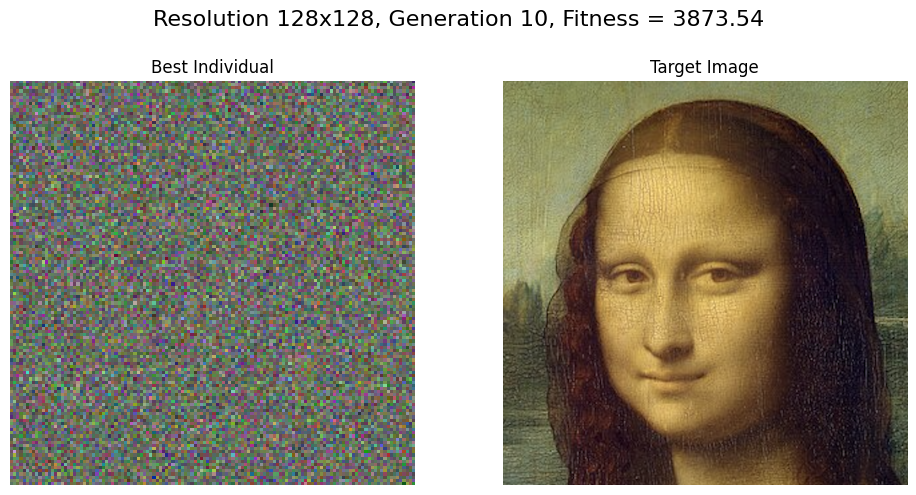

Generation 100/30000. Best fitness: 3752.925. Mutation rate: 0.305, time [13:05:22]


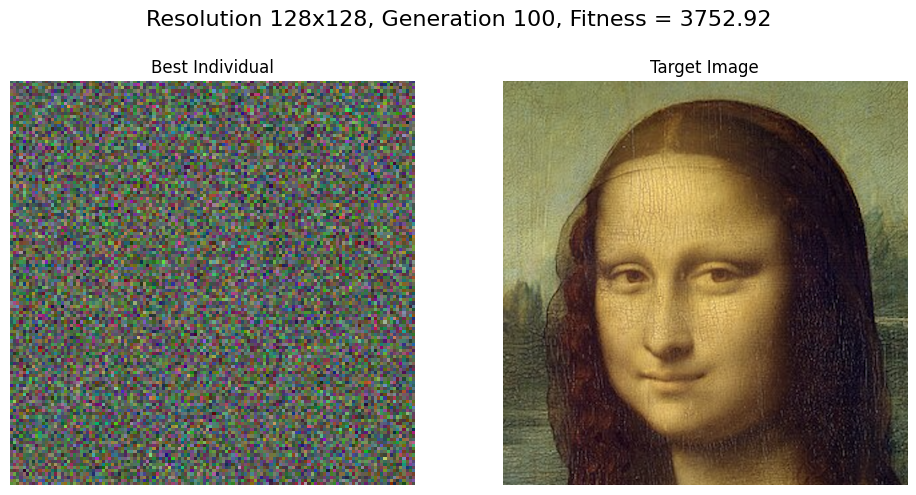

Stagnation detected at generation 306. Actual mutation rate: 0.126. Increasing mutation rate.
Stagnation detected at generation 336. Actual mutation rate: 0.152. Increasing mutation rate.
Stagnation detected at generation 366. Actual mutation rate: 0.182. Increasing mutation rate.
Stagnation detected at generation 396. Actual mutation rate: 0.218. Increasing mutation rate.
Stagnation detected at generation 426. Actual mutation rate: 0.262. Increasing mutation rate.
Stagnation detected at generation 456. Actual mutation rate: 0.315. Increasing mutation rate.
Stagnation detected at generation 486. Actual mutation rate: 0.377. Increasing mutation rate.
Stagnation detected at generation 516. Actual mutation rate: 0.453. Increasing mutation rate.
Stagnation detected at generation 546. Actual mutation rate: 0.500. Increasing mutation rate.
Stagnation detected at generation 576. Actual mutation rate: 0.500. Increasing mutation rate.
Stagnation detected at generation 606. Actual mutation rate:

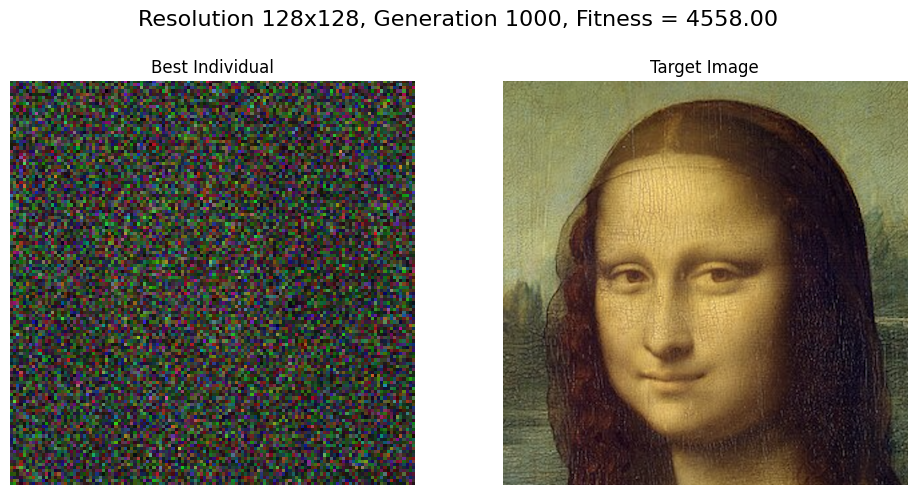

Generation 2000/30000. Best fitness: 4044.949. Mutation rate: 0.001, time [13:07:07]


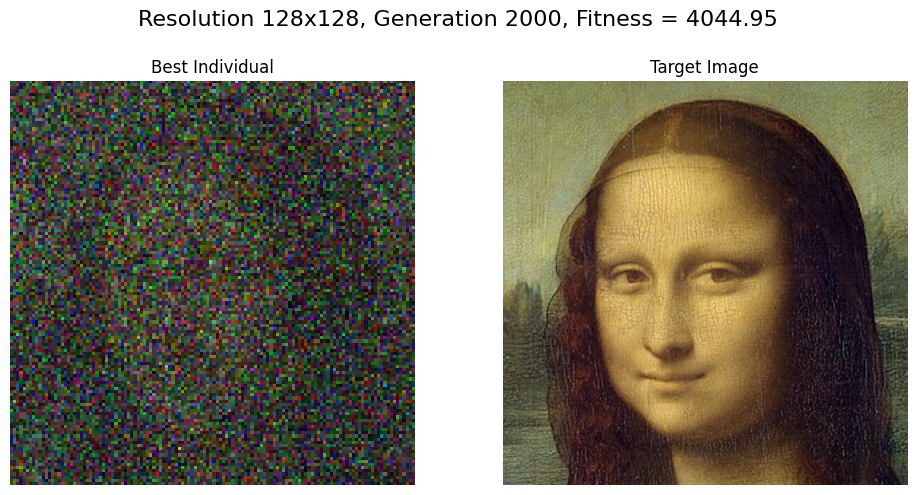

Generation 3000/30000. Best fitness: 3633.133. Mutation rate: 0.001, time [13:08:03]


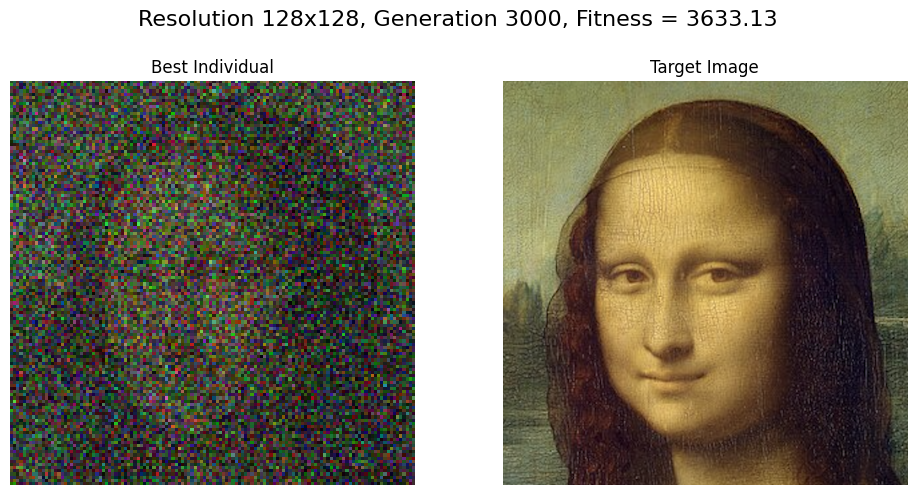

Generation 4000/30000. Best fitness: 3250.927. Mutation rate: 0.001, time [13:08:58]


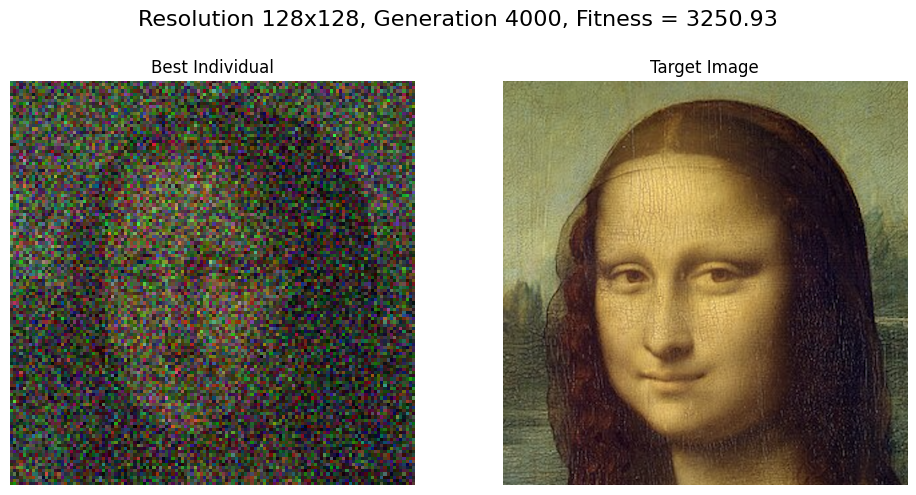

Generation 5000/30000. Best fitness: 2894.144. Mutation rate: 0.001, time [13:09:52]


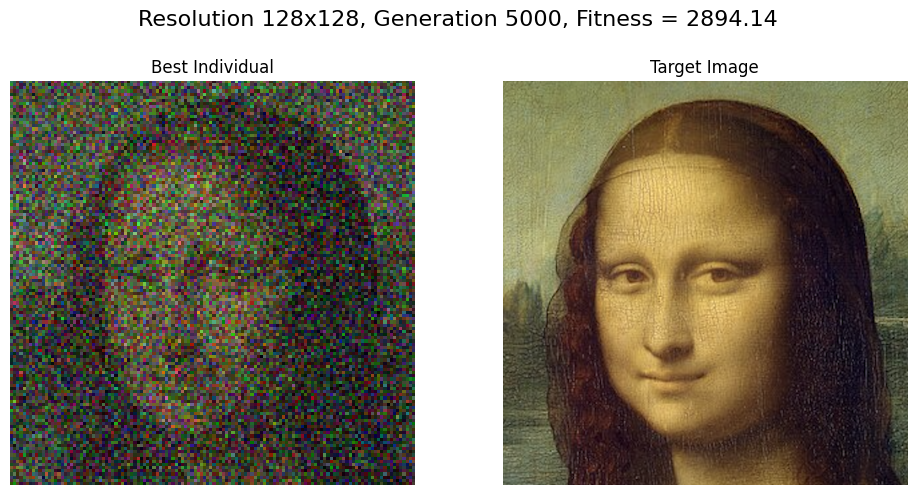

Generation 6000/30000. Best fitness: 2576.350. Mutation rate: 0.001, time [13:10:47]


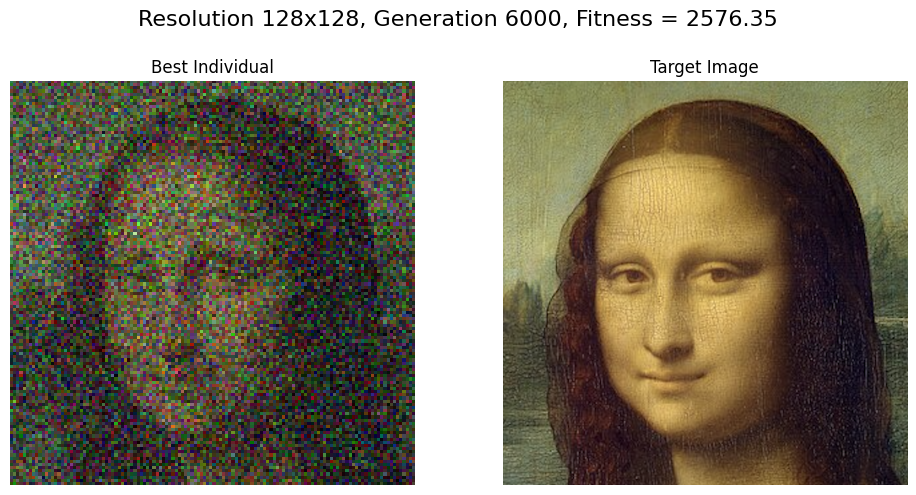

Generation 7000/30000. Best fitness: 2282.239. Mutation rate: 0.001, time [13:11:42]


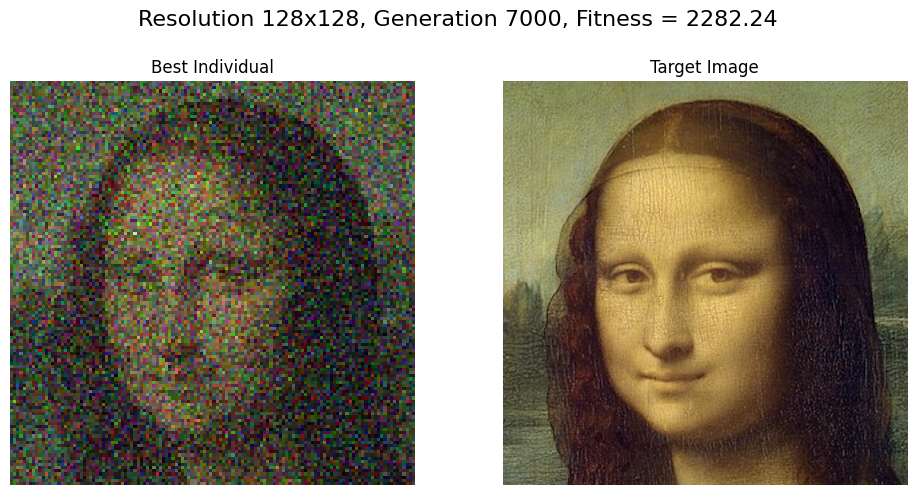

Generation 8000/30000. Best fitness: 2019.271. Mutation rate: 0.001, time [13:12:36]


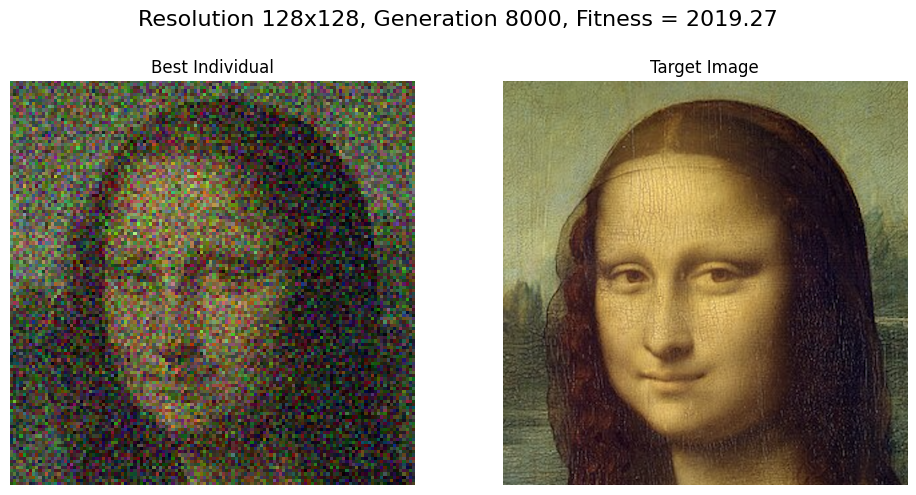

Generation 9000/30000. Best fitness: 1777.408. Mutation rate: 0.001, time [13:13:31]


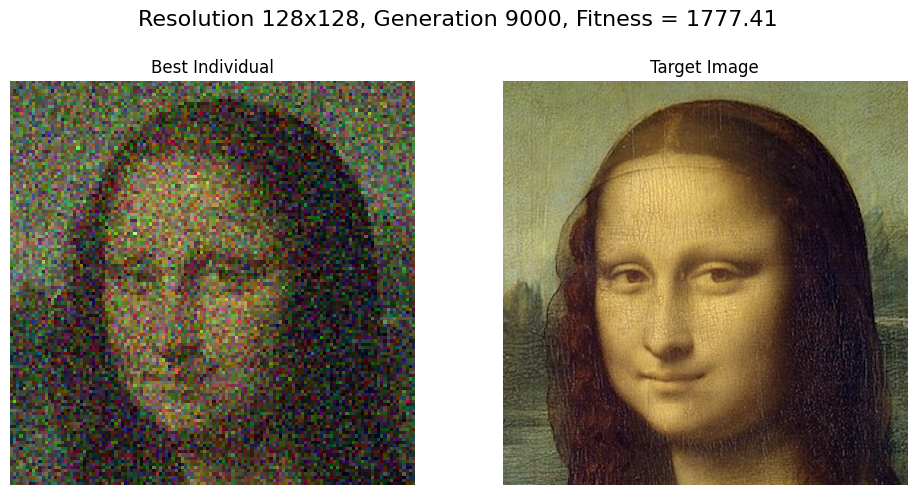

Generation 10000/30000. Best fitness: 1563.713. Mutation rate: 0.001, time [13:14:26]


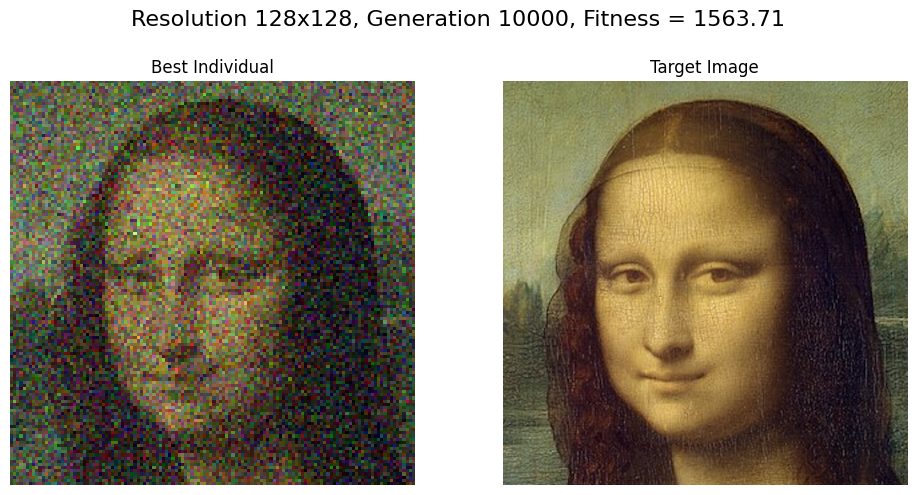

Generation 11000/30000. Best fitness: 1371.321. Mutation rate: 0.001, time [13:15:20]


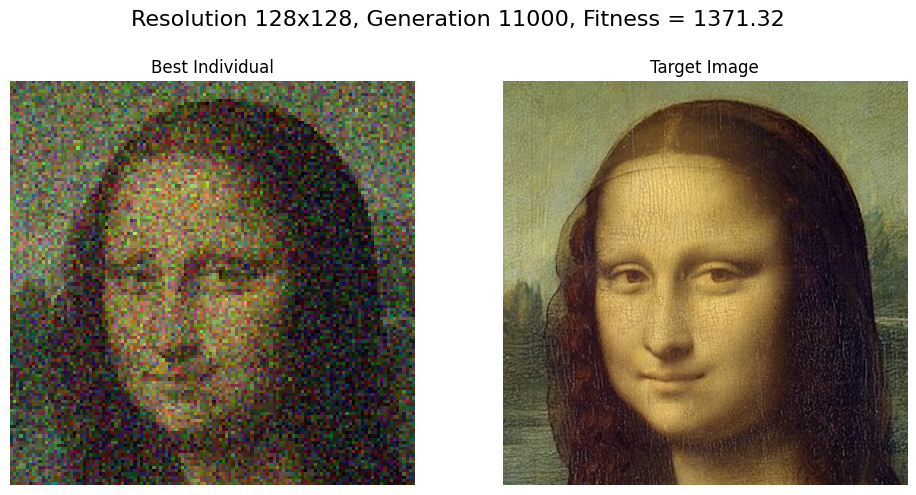

Generation 12000/30000. Best fitness: 1203.387. Mutation rate: 0.001, time [13:16:16]


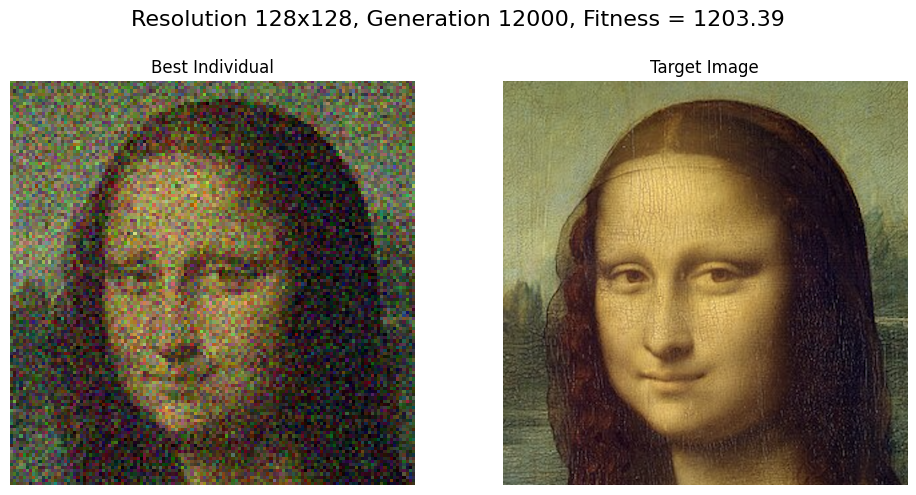

Generation 13000/30000. Best fitness: 1057.142. Mutation rate: 0.001, time [13:17:11]


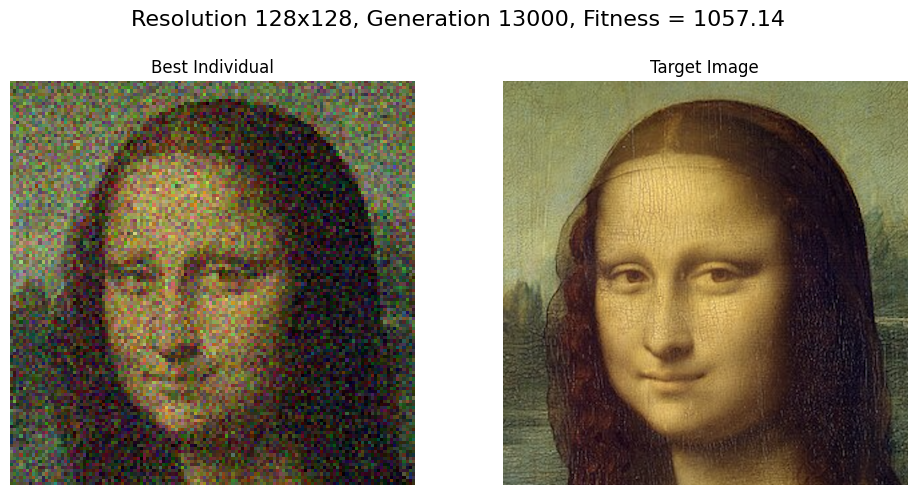

Generation 14000/30000. Best fitness: 927.120. Mutation rate: 0.001, time [13:18:07]


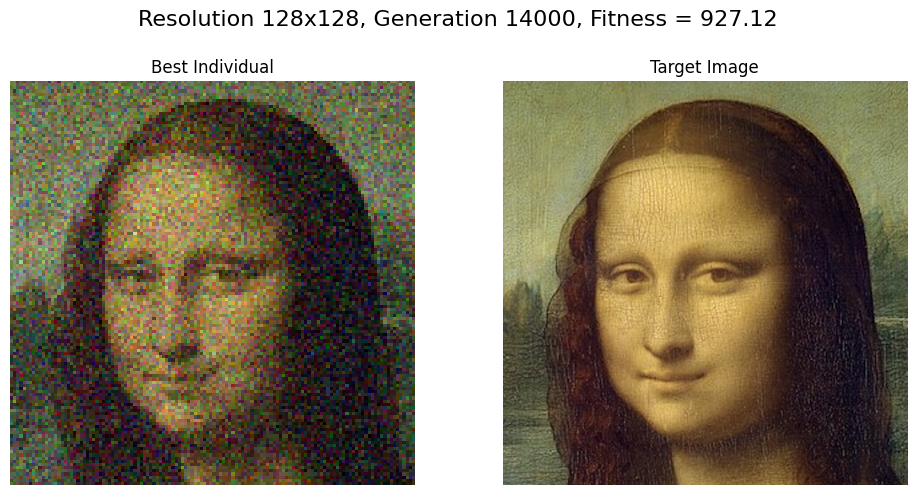

Generation 15000/30000. Best fitness: 817.305. Mutation rate: 0.001, time [13:19:02]


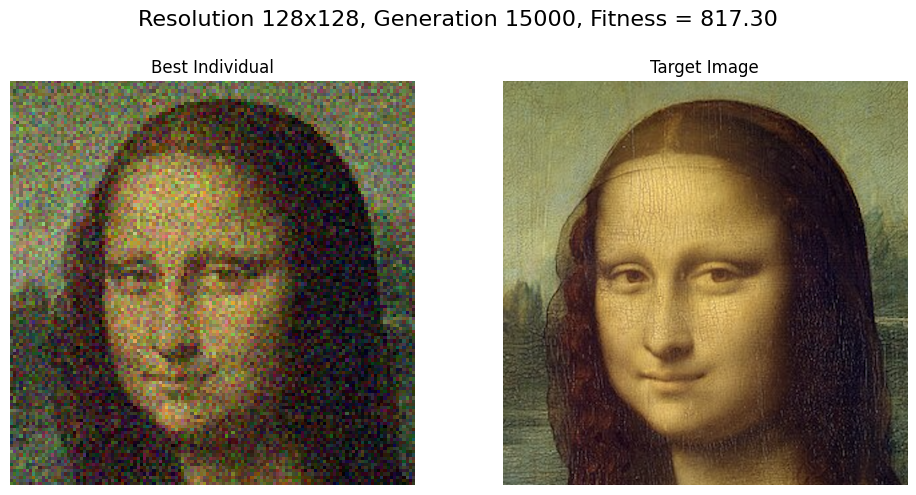

Generation 16000/30000. Best fitness: 718.980. Mutation rate: 0.001, time [13:19:57]


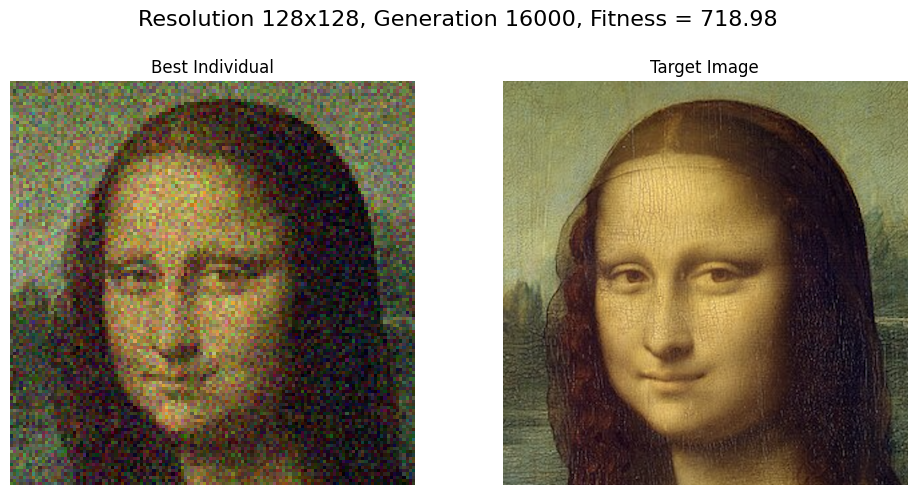

Generation 17000/30000. Best fitness: 636.904. Mutation rate: 0.001, time [13:20:52]


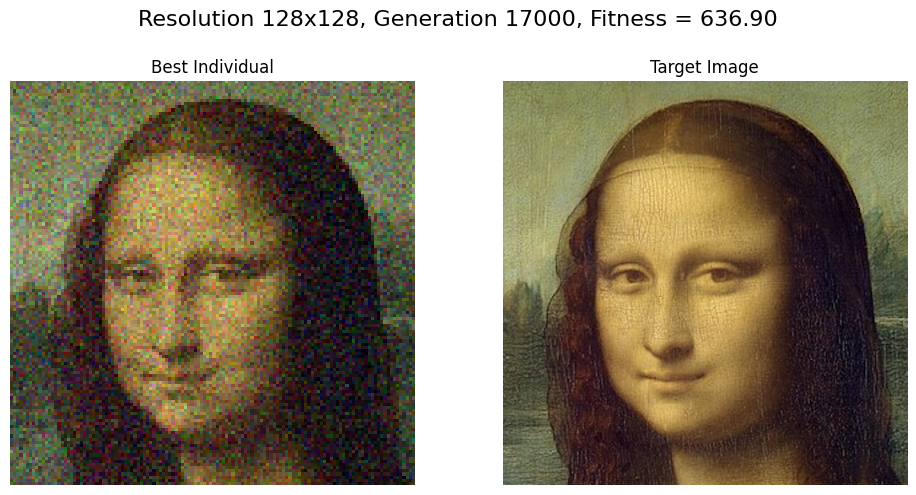

Generation 18000/30000. Best fitness: 565.035. Mutation rate: 0.001, time [13:21:48]


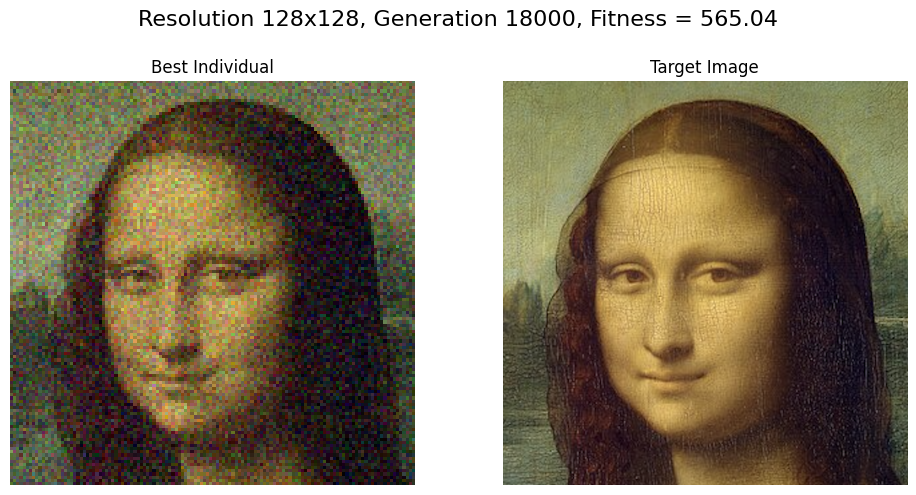

Generation 19000/30000. Best fitness: 502.737. Mutation rate: 0.001, time [13:22:43]


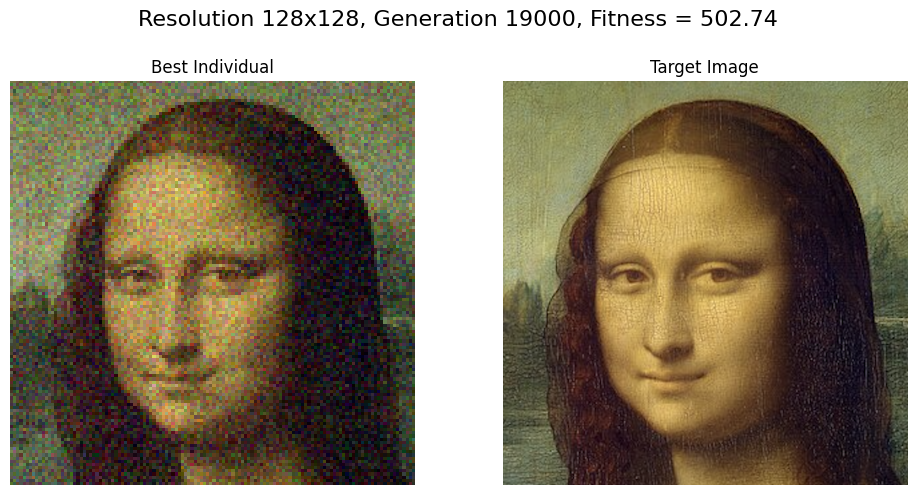

Generation 20000/30000. Best fitness: 451.303. Mutation rate: 0.001, time [13:23:38]


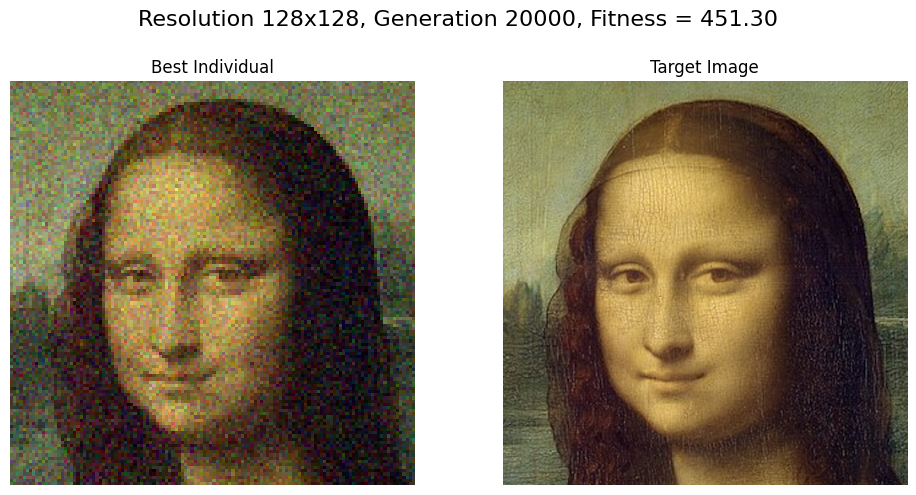

Generation 21000/30000. Best fitness: 405.946. Mutation rate: 0.001, time [13:24:33]


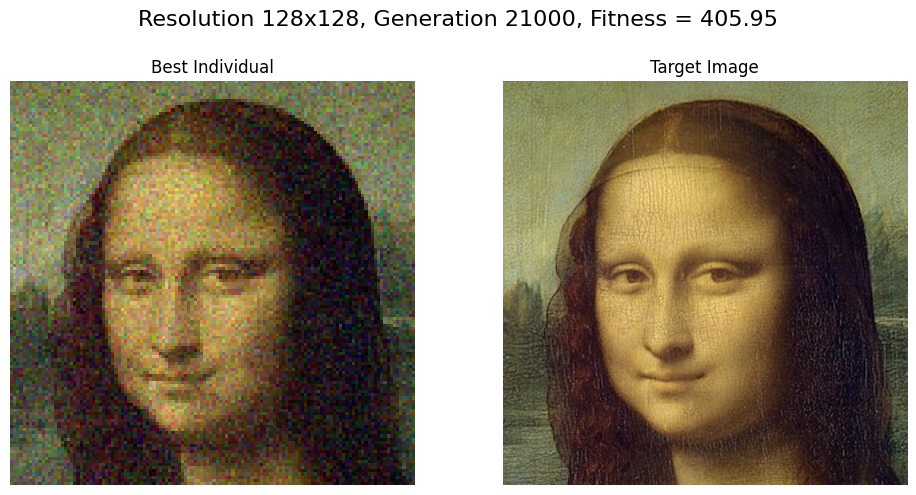

Generation 22000/30000. Best fitness: 368.334. Mutation rate: 0.001, time [13:25:28]


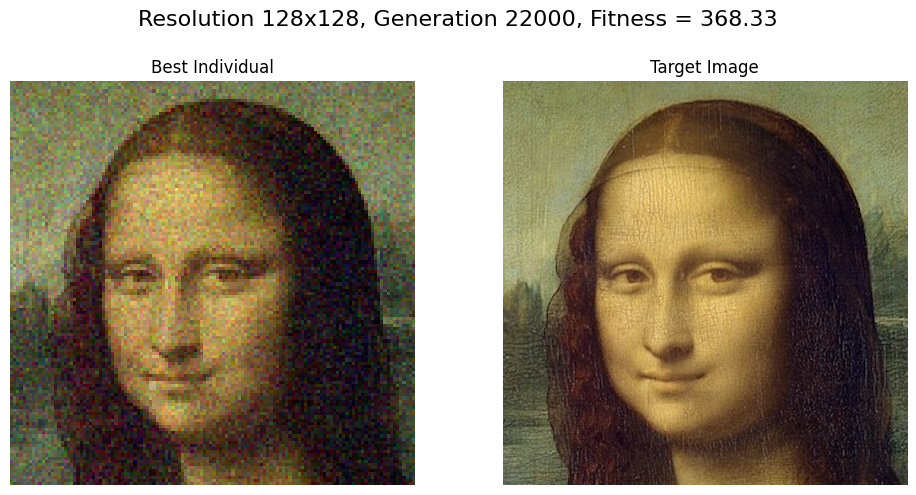

Generation 23000/30000. Best fitness: 335.790. Mutation rate: 0.001, time [13:26:23]


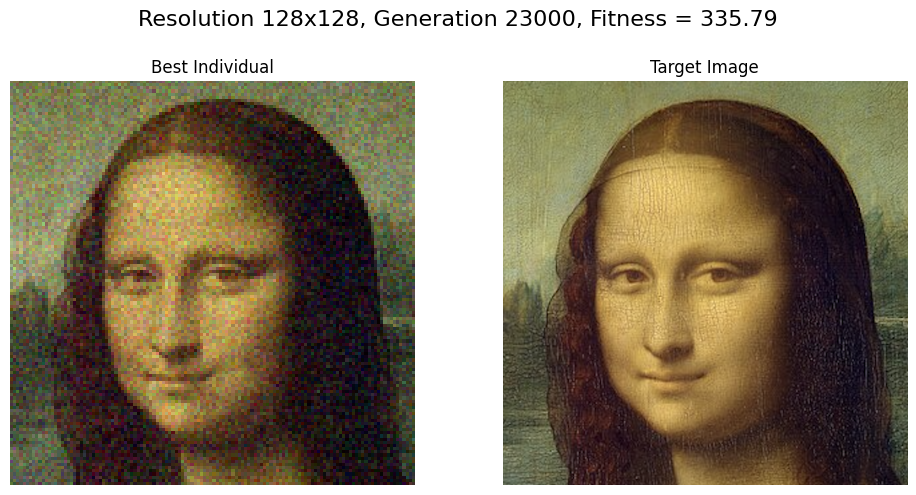

Generation 24000/30000. Best fitness: 306.806. Mutation rate: 0.001, time [13:27:19]


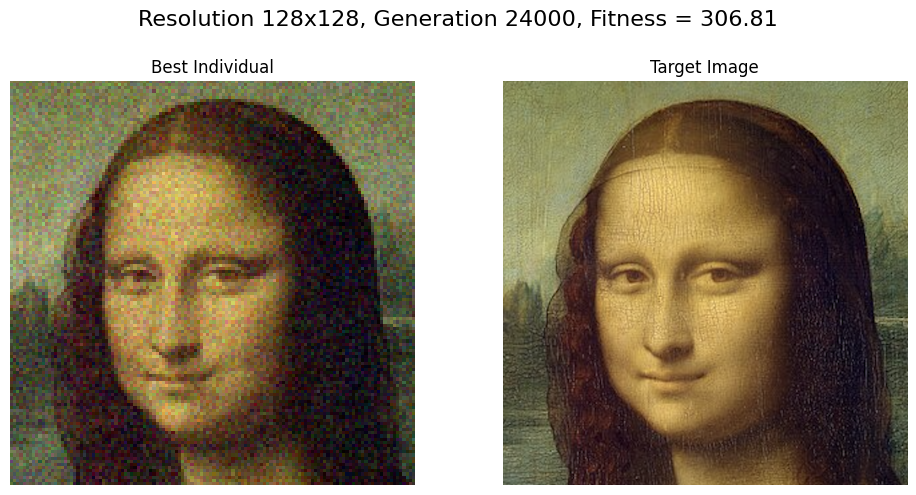

Generation 25000/30000. Best fitness: 283.615. Mutation rate: 0.001, time [13:28:15]


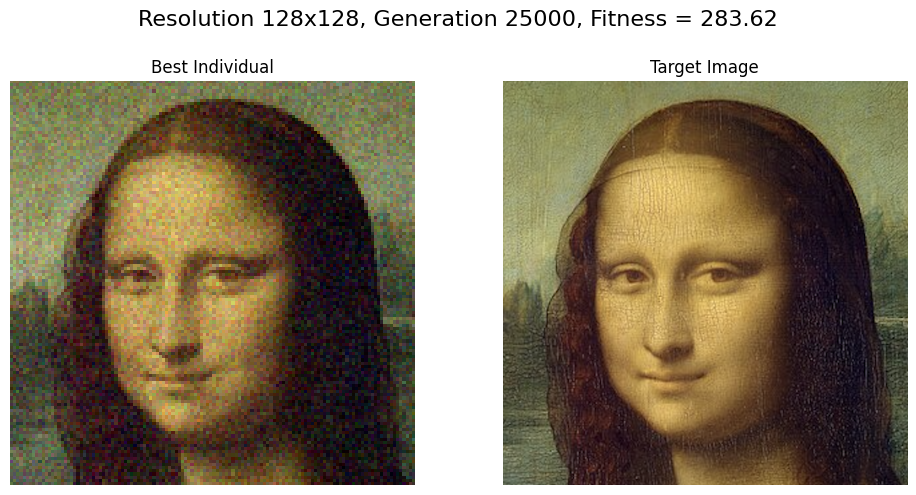

Generation 26000/30000. Best fitness: 264.855. Mutation rate: 0.001, time [13:29:10]


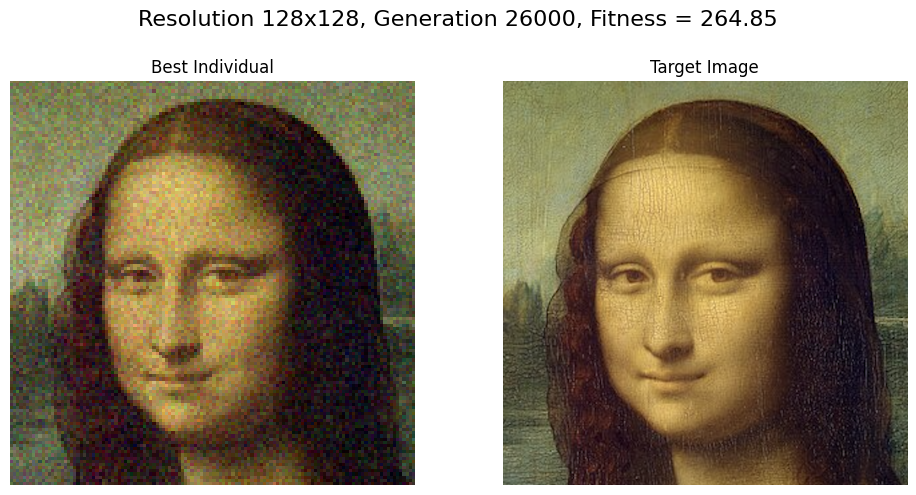

Generation 27000/30000. Best fitness: 248.567. Mutation rate: 0.001, time [13:30:06]


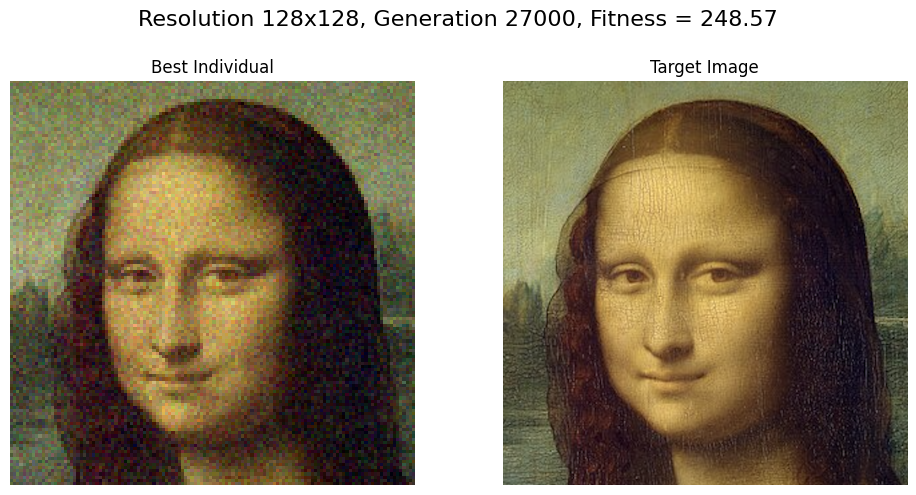

Generation 28000/30000. Best fitness: 233.860. Mutation rate: 0.001, time [13:31:01]


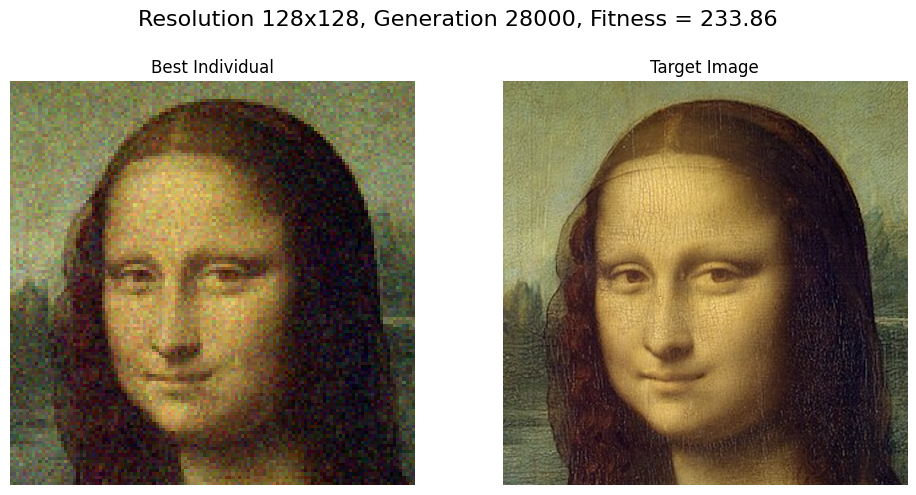

Generation 29000/30000. Best fitness: 221.273. Mutation rate: 0.001, time [13:31:58]


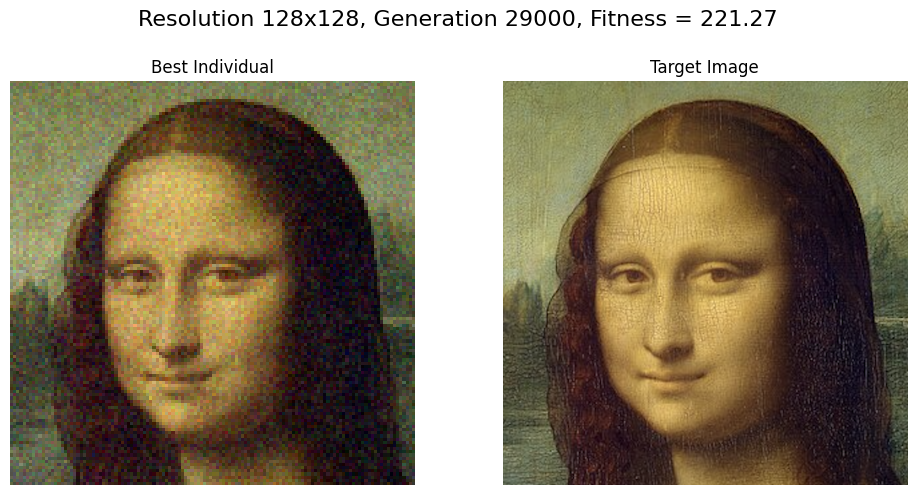

Generation 29999/30000. Best fitness: 210.017. Mutation rate: 0.001, time [13:32:53]


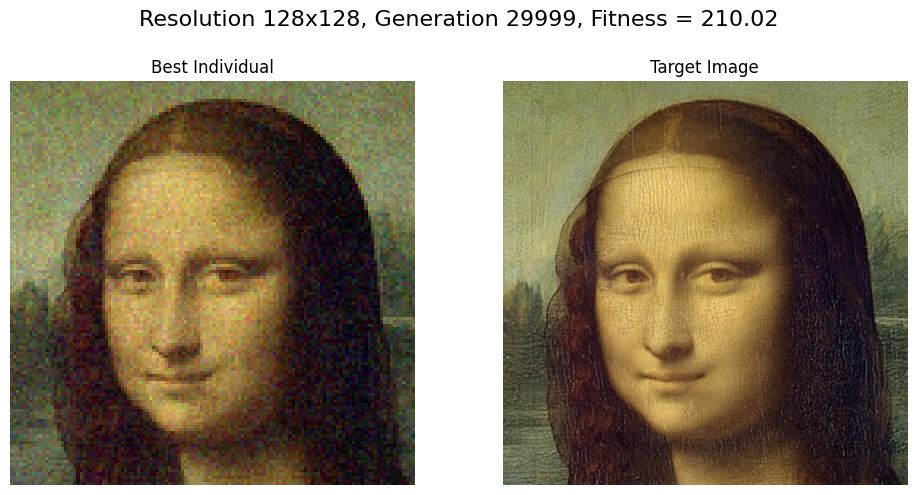

Generation 30000/30000. Best fitness: 210.010. Mutation rate: 0.001, time [13:32:54]


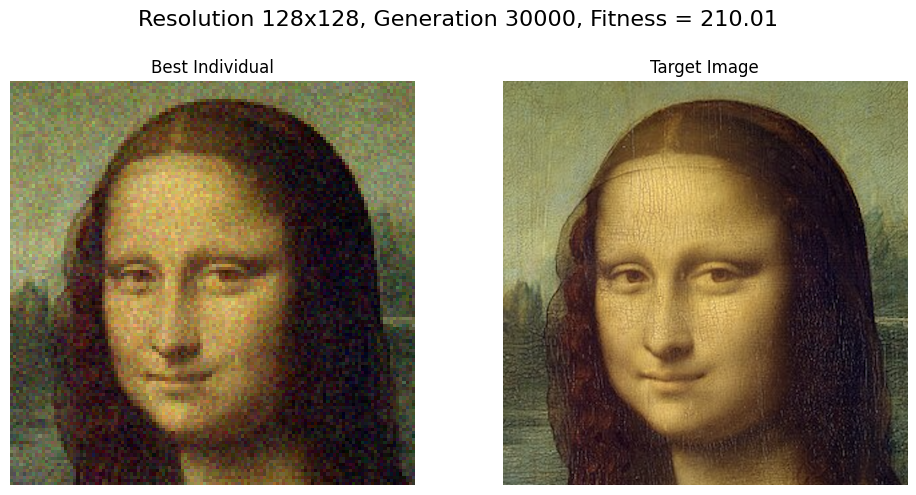

Data exported successfully.


In [2]:
start_time = time.time()
result_128, fitness_evolution_128 = evolve(image_path, 
           pop_size = 100, 
           palette_size = 255, 
           generations = 30000, 
           mutation_rate = 0.5,
           max_mutation_rate = 0.5,
           tournament_size = 8,
           replacement = 20,
           min_mutation_rate = 0.0005,
           stagnation_limit = 30,
           exit_limit = 200,
           n = 128,
           fit = 'mse')
end_time = time.time()

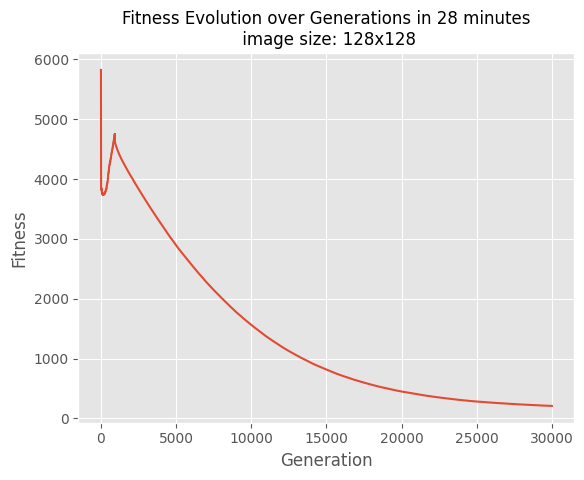

In [3]:

n = 128

plt.style.use('ggplot')

plt.plot(fitness_evolution_128)
plt.xlabel('Generation')
plt.ylabel('Fitness')
plt.title(f'Fitness Evolution over Generations in {((end_time - start_time)//60):.0f} minutes\n image size: {n}x{n}', fontsize=12)
plt.savefig(f'../evolution_{n}/fitness_evolution_{n}.png')
plt.show()

In [4]:
np.save(f'../evolution_{n}/best_ind.npy', result_128)

In [5]:

# Source images folder
folder_path = f"../evolution_{n}/images_{n}"  

# Output GIF file
output_gif = f"../evolution_{n}/output.gif"

# Read all images in the folder
images = []
for file_name in sorted(os.listdir(folder_path)):
    if file_name.endswith(('.png', '.jpg', '.jpeg')):
        img_path = os.path.join(folder_path, file_name)
        img = Image.open(img_path).convert("RGBA")
        images.append(img)

# Create GIF
if images:
    images[0].save(
        output_gif,
        save_all=True,
        append_images=images[1:],
        duration=200, # milliseconds per frame
        loop=0  # infinite loop
    )
    print(f"GIF creation done: {output_gif}")
else:
    print("No images found in the folder.")

GIF creation done: ../evolution_128/output.gif
